# **Retrieving vector data**

## goals of the tutorial
- geocoding / reverse geocoding
- OGC services
- understand openstreetmap
- understand the openstreetmap data model
- manage openstreetmap data in geopandas

**based on the open data of:**
- [geocoders](https://getlan.lot)
- [national repertoire of territorial data](https://geodati.gov.it/geoportale/)
- [geoportal of Trentino](http://www.territorio.provincia.tn.it/portal/server.pt/community/portale_geocartografico_trentino/254)
- [openstreetmap](https://wiki.openstreetmap.org)


### requirements
- python knowledge
- geopandas
- gis concepts


**status**

*looking for data*

---

# Geocoding / reverse geocoding

## Setup

In [1]:
pip install -r https://napo.github.io/geospatialcourse2025/requirements.txt --break-system-packages

In [2]:
import geopandas as gpd
from matplotlib import pyplot as plt
import warnings
warnings.simplefilter("ignore") #to avoid warning message


**GEOCODING service**

![](https://avatars2.githubusercontent.com/u/1385808?s=400&v=4")

- the geopandas module is based on [geopy](https://geopy.readthedocs.io/en/stable/)
- all the goecoders service are available [here](https://geopy.readthedocs.io/en/stable/#module-geopy.geocoders)


**NOTE**

Attention to the Rate Limit in Pandas<br/>
more info [here](https://geopy.readthedocs.io/en/stable/#usage-with-pandas)

**choose the right service**
<br/><br/>

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/getlonlat.png)


## geocoding

In [3]:
cols = ['city']
names = [('Roma'),('Palermo'),('Trento'),('Genova'),('Bari'),('Trieste'),('Napoli'),('Cagliari'),('Messina'),('Lecce')]
cities = gpd.GeoDataFrame(names,columns=cols)

In [4]:
cities

,city
0,Roma
1,Palermo
2,Trento
3,Genova
4,Bari
5,Trieste
6,Napoli
7,Cagliari
8,Messina
9,Lecce


In [5]:
geo_cities = gpd.tools.geocode(cities.city, provider="arcgis")
%time

CPU times: user 4 µs, sys: 1e+03 ns, total: 5 µs
Wall time: 7.87 µs


In [6]:
geo_cities

,geometry,address
0,POINT (12.49427 41.89056),Roma
1,POINT (13.36147 38.11566),Palermo
2,POINT (11.11907 46.06667),Trento
3,POINT (8.93399 44.40706),Genova
4,POINT (16.87211 41.12591),Bari
5,POINT (13.77852 45.6536),Trieste
6,POINT (14.25254 40.83998),Napoli
7,POINT (9.10932 39.21541),Cagliari
8,POINT (15.55552 38.19233),Messina
9,POINT (18.17401 40.35329),Lecce


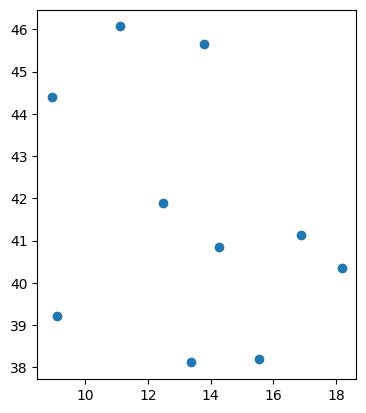

In [7]:
geo_cities.plot()
plt.show()

## reverse geocoding

In [8]:
from geopy.geocoders import Nominatim

In [9]:
geo_cities

,geometry,address
0,POINT (12.49427 41.89056),Roma
1,POINT (13.36147 38.11566),Palermo
2,POINT (11.11907 46.06667),Trento
3,POINT (8.93399 44.40706),Genova
4,POINT (16.87211 41.12591),Bari
5,POINT (13.77852 45.6536),Trieste
6,POINT (14.25254 40.83998),Napoli
7,POINT (9.10932 39.21541),Cagliari
8,POINT (15.55552 38.19233),Messina
9,POINT (18.17401 40.35329),Lecce


In [10]:
point = geo_cities.geometry[2]

In [11]:
point.wkt

'POINT (11.1190676 46.0666665)'

In [12]:
type(point.x)

float

In [13]:
latlon = str(point.y) + "," + str(point.x)

In [14]:
point.x

11.1190676

In [15]:
latlon

'46.0666665,11.1190676'

In [16]:
geolocator = Nominatim(user_agent="Example for the course")

.. but better if use a user agent like

*Mozilla/5.0 (Linux; Android 10) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/86.0.4240.75 Mobile Safari/537.36*

Eg

*geolocator = Nominatim(user_agent="Mozilla/5.0 (Linux; Android10) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/86.0.4240.75 Mobile Safari/537.36")*



In [17]:
location = geolocator.reverse(latlon)
%time

CPU times: user 5 µs, sys: 1 µs, total: 6 µs
Wall time: 23.6 µs


the raw method contains all the data available from the geocoder

In [18]:
location.raw

{'place_id': 408232580,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://osm.org/copyright',
 'osm_type': 'way',
 'osm_id': 23763416,
 'lat': '46.0666561',
 'lon': '11.1190687',
 'class': 'highway',
 'type': 'residential',
 'place_rank': 26,
 'importance': 0.053403586633096786,
 'addresstype': 'road',
 'name': 'Via Giuseppe Verdi',
 'display_name': "Via Giuseppe Verdi, Le Albere, San Giuseppe - Santa Chiara, Trento, Territorio Val d'Adige, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38122, Italia",
 'address': {'road': 'Via Giuseppe Verdi',
  'suburb': 'Le Albere',
  'city': 'Trento',
  'municipality': "Territorio Val d'Adige",
  'county': 'Provincia di Trento',
  'ISO3166-2-lvl6': 'IT-TN',
  'state': 'Trentino-Alto Adige/Südtirol',
  'ISO3166-2-lvl4': 'IT-32',
  'postcode': '38122',
  'country': 'Italia',
  'country_code': 'it'},
 'boundingbox': ['46.0666524', '46.0666639', '11.1190333', '11.1191419']}

## suggestion for a good geocoding
more details you add and more fortune you have to obtain a good result

In [19]:
q="Via Verdi, 26"

In [20]:
point = gpd.tools.geocode(q, provider="arcgis")

In [21]:
point

,geometry,address
0,POINT (9.97612 45.59683),Via Verdi


In [22]:
point.explore(marker_kwds={"color": "green", "radius": "10"})

add details like city and Country

In [23]:
q="Via Giuseppe Verdi, 26,  Trento, Italia"

In [24]:
point = gpd.tools.geocode(q, provider="arcgis")

In [25]:
point

,geometry,address
0,POINT (11.11966 46.06665),"Via Giuseppe Verdi 26, 38122, Trento"


In [26]:
point.explore(marker_kwds={"color": "green", "radius": "10"})

Try a different geocoder

In [28]:
point_nominatim = gpd.tools.geocode(q,provider="Nominatim",user_agent="Example for the course")

In [29]:
point_nominatim

,geometry,address
0,POINT (11.11971 46.06641),"Dipartimento di Sociologia e Ricerca Sociale, ..."


In [30]:
q="Via Giuseppe Verdi, 26,  Trento, Italia"

In [31]:
point_nominatim = gpd.tools.geocode(q, provider="Nominatim",user_agent="Example for the course")

In [32]:
point_nominatim

,geometry,address
0,POINT (11.11971 46.06641),"Dipartimento di Sociologia e Ricerca Sociale, ..."


In [33]:
point_nominatim.explore(marker_kwds={"color": "green", "radius": "10"})

calculate the difference between the two points

In [34]:
distance = point.to_crs('epsg:32632').geometry.distance(point_nominatim.geometry.to_crs('epsg:32632')).values[0]

In [35]:
distance

np.float64(26.281407978714036)

**NOTE**:<br/>
A geocoder can offers more as one results<br/>
Eg. Nominatim

In [42]:
more_values = geolocator.geocode(q,exactly_one=False)

In [43]:
more_values

[Location(Dipartimento di Sociologia e Ricerca Sociale, 26, Via Giuseppe Verdi, Le Albere, San Giuseppe - Santa Chiara, Trento, Territorio Val d'Adige, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38122, Italia, (46.0664135, 11.1197056, 0.0)),
 Location(26, Via Giuseppe Verdi, Le Albere, San Giuseppe - Santa Chiara, Trento, Territorio Val d'Adige, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38122, Italia, (46.066644, 11.1196548, 0.0)),
 Location(26, Via Giuseppe Verdi, Vigne, Arco, Comunità Alto Garda e Ledro, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38062, Italia, (45.9211546, 10.8647503, 0.0)),
 Location(26, Via Giuseppe Verdi, Brancolino, Nogaredo, Comunità della Vallagarina, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38060, Italia, (45.9106572, 11.0227918, 0.0))]

In [44]:
more_values[1].raw

{'place_id': 67441517,
 'licence': 'Data © OpenStreetMap contributors, ODbL 1.0. http://osm.org/copyright',
 'osm_type': 'node',
 'osm_id': 941909198,
 'lat': '46.0666440',
 'lon': '11.1196548',
 'class': 'place',
 'type': 'house',
 'place_rank': 30,
 'importance': 7.025329976343965e-05,
 'addresstype': 'place',
 'name': '',
 'display_name': "26, Via Giuseppe Verdi, Le Albere, San Giuseppe - Santa Chiara, Trento, Territorio Val d'Adige, Provincia di Trento, Trentino-Alto Adige/Südtirol, 38122, Italia",
 'boundingbox': ['46.0665940', '46.0666940', '11.1196048', '11.1197048']}

In [45]:
more_values[1].point

Point(46.066644, 11.1196548, 0.0)

## **Summary**

- geocoding is, first of all, an NLP problem<br/>&nbsp;suggestion: use [pypostal](https://github.com/openvenues/pypostal) to normalize the names
- geocoding services try to normalize the query by identifying the object you are looking for
- the more information of a geographic hierarchical order the better the geocoder results
- it is difficult to have an always updated address database
- many geocoders, where they do not find the value, return a value inferred from the interpolation
- accuracy depends on what you are looking for
- a geocoder always tries to give an answer<br/>&nbsp;an excellent geocoder also returns the value of the precision estimate


# OGC Services
![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/ogc_services.png)

---

## Catalog Service for the Web

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/geocatalog_pat.png)

---

https://siat.provincia.tn.it/geonetwork/srv/eng/catalog.search




## Setup
https://geopython.github.io/OWSLib/

In [46]:
from owslib.csw import CatalogueServiceWeb

In [47]:
csw = CatalogueServiceWeb("http://geodati.gov.it/RNDT/csw")

In [48]:
csw.service

'CSW'

In [49]:
[op.name for op in csw.operations]

['GetCapabilities',
 'DescribeRecord',
 'GetRecords',
 'GetRecordById',
 'Transaction',
 'Harvest']

In [50]:
from owslib.fes import PropertyIsLike, BBox

fields to query

|                |                            |
|---             |---                         |
|field           | description                |
|*dc:title*      | title of the dataset       |
|*dc:description*| description of the dataset |
|*dc:subject*    | subject of the dataset     |
|*csw:AnyText*   | in all the fields          |

*PropertyIsLike* means that you can use the *LIKE* syntax of SQL

Eg. *%rento* => each word that ends with 'rento'

In [51]:
trento_query = PropertyIsLike('csw:AnyText', 'Trento')

In [52]:
csw.getrecords2(constraints=[trento_query],maxrecords=100)

In [53]:
csw.results

{'matches': 145, 'returned': 100, 'nextrecord': 101}

In [54]:
for rec in csw.records:
  print(rec + " - " + csw.records[rec].title)

p_tn:SECAP_APRIE_Trento - SECAP APRIE Trento
agea:00129:20090724:090446 - Ortofotocarta Trento 2003
agea:00377:20090911:093144 - Ortofotocarta Trento 2008
agea:00128:20090724:085449 - Ortofotocarta Trento 1997
p_TN:377793f1-1094-4e81-810e-403897418b23 - Limite Provinciale della Provincia Autonoma di Trento
ispra_rm:Meta_Geo_SV000056_RN - Trento topografia 25k - View Service
p_TN:6180b262-787f-4c70-93e2-b774f698f544 - Limite Provinciale della Provincia Autonoma di Trento - wms
p_TN:09889801-a323-43c9-b336-462c28ef549d - Catasto Sorgenti della Provincia Autonoma di Trento
c_l378:toponomastica - Stradario, civici e toponimi del Comune di Trento
c_l378:ortofoto2009 - Ortofoto 2009
p_TN:04933f2c-3e81-4c68-8fd6-1fcfb40deb4b - Areale del castagno
p_TN:3c0db76b-a9ff-4293-b5fc-f1b44d9d85de - Proprietà forestali trentine
p_TN:8241b215-4a48-4ca3-97ba-e9eb2b3af90f - Stazioni forestali
p_TN:01ecba21-ca89-492e-9601-d585c4e1d5d1 - Zone ecologiche trentine
p_TN:71403f02-0b4e-4f02-8475-1321c04e184c - P

```
p_TN:baee5106-0185-4428-bd35-b041bebc8564 - campsites
```

campsites of the Autonomous Province of Trento

In [55]:
s="p_TN:baee5106-0185-4428-bd35-b041bebc8564"

In [56]:
record = csw.records[s]

In [57]:
record.title

'Campeggi'

In [58]:
record.abstract

"Il dataset contiene la localizzazione puntuale delle strutture ricettive all'aperto (campeggi, campeggi-villaggio e campeggi parco per vacanze), presenti sul territorio della Provincia di Trento."

In [59]:
for reference in record.references:
  print(reference['scheme'])
  print(reference['url'])

urn:x-esri:specification:ServiceType:ArcIMS:Metadata:Server
https://siatservices.provincia.tn.it/idt/vector/p_TN_baee5106-0185-4428-bd35-b041bebc8564.zip
urn:x-esri:specification:ServiceType:ArcIMS:Metadata:Document
https://geodati.gov.it/geoportalRNDTPA/csw?getxml=%7B511E647F-FCEC-493D-83ED-6B820EF14F3B%7D


In [60]:
campsites = gpd.read_file('https://idt.provincia.tn.it/idt/vector/p_TN_baee5106-0185-4428-bd35-b041bebc8564.zip')

In [61]:
campsites.head(5)

,cap,prec,quota,comune,classid,dataagg,datafine,frazione,objectid,controllo,...,codice_str,denominazi,fax_eserci,tel_eserci,web_eserci,sottotipol,email_eser,periodo_ap,livello_cl,geometry
0,38050,3,769,TORCEGNO,TUR004_3,2021/01/01 00:00:00.000,None,None,26780,GMR 30/10/2020,...,C00001,CAMPEGGIO AI CASTAGNI,0461-766129,0461-766129,None,Campeggio parco per vacanze,campingaicastagni@libero.it,annuale,*,MULTIPOINT ((689306.819 5105762.615))
1,38067,3,660,LEDRO,TUR004_4,2021/01/01 00:00:00.000,None,PIEVE DI LEDRO,26781,GMR 30/10/2020,...,C00003,CAMPEGGIO AL LAGO,0464-905467,0464-591250,www.camping-al-lago.it,Campeggio,info@camping-al-lago.it,annuale,*,MULTIPOINT ((634360 5082549))
2,38053,3,871,CASTELLO TESINO,TUR004_6,2021/01/01 00:00:00.000,None,CELADO,26782,GMR 30/10/2020,...,12266,CAMPEGGIO ALICE,None,0461-594018,www.campeggioalice.it,Campeggio,campeggioalice@libero.it,annuale,***,MULTIPOINT ((705152.431 5102825.779))
3,38010,3,1042,ANDALO,TUR004_7,2021/01/01 00:00:00.000,None,None,26783,GMR 30/10/2020,...,C00008,CAMPEGGIO ANDALO,0461-585342,0461-585753,www.andalo.life/it/camping,Campeggio parco per vacanze,campeggio@andalolifepark.it,annuale,**,MULTIPOINT ((654860 5115035))
4,38062,3,91,ARCO,TUR004_8,2021/01/01 00:00:00.000,None,PRABI,26784,GMR 30/10/2020,...,C00009,CAMPEGGIO ARCO,0464-515525,0464-517491,www.arcoturistica.com,Campeggio,info@arcoturistica.com,annuale,***,MULTIPOINT ((646688.911 5087665.405))


In [62]:
campsites.crs

<Projected CRS: EPSG:25832>
Name: ETRS89 / UTM zone 32N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe between 6°E and 12°E: Austria; Denmark - onshore and offshore; Germany - onshore and offshore; Italy - onshore and offshore; Norway including Svalbard - onshore and offshore; Spain - offshore.
- bounds: (6.0, 36.53, 12.01, 84.01)
Coordinate Operation:
- name: UTM zone 32N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989 ensemble
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

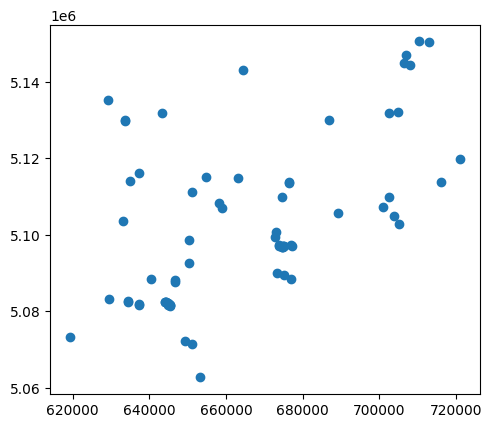

In [63]:
campsites.plot()
plt.show()

we can search by bounding box

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/bbox_klokantech.png)

[https://boundingbox.klokantech.com/](https://boundingbox.klokantech.com/)

In [64]:
#csw = CatalogueServiceWeb("http://www.pcn.minambiente.it/geoportal/csw")
csw = CatalogueServiceWeb("http://geodati.gov.it/RNDT/csw")

In [65]:
bbox_query = BBox([11.188617,45.965651,11.376758,46.073412])

In [66]:
csw.getrecords2(constraints=[bbox_query],maxrecords=100)

In [67]:
csw.results

{'matches': 2674, 'returned': 100, 'nextrecord': 101}

In [68]:
for rec in csw.records:
  print(rec + " - " + csw.records[rec].title)

p_TN:bb9e5a5c-36bd-46a0-b7b5-67613b178777 - IFF2007 nel BACINO DEL FIUME BRENTA
c_l378:ortofoto2009 - Ortofoto 2009
c_l378:ct2000 - Carta Tecnica 1:2.000 alta risoluzione
c_l378:4e54a476-38a7-4c75-a692-c5c270b3c091-carta_semplificata - Carta Semplificata
c_l378:prg_vigente - PRG vigente
c_l378:toponomastica - Stradario, civici e toponimi del Comune di Trento
p_TN:3631bc23-87d1-4b55-8fe8-5e95a2323b01 - Piste Ciclabili - wms
p_TN:6180b262-787f-4c70-93e2-b774f698f544 - Limite Provinciale della Provincia Autonoma di Trento - wms
p_TN:74e3285e-43a4-4fa9-9fb3-c5b3ddcea4d5 - Irraggiamento - wms
p_TN:80a69407-0e82-4571-9156-20a4754ae289 - Limite Comune Amministrativo - wms
p_TN:c743e9d8-7055-417e-a47b-269460a83d74 - Zone Speciali di Conservazione
p_TN:054e1af3-2dd8-4496-8b83-261cccc2674c - Ortofoto Ravina 2007 RGB
p_TN:0837bfca-dff2-4770-801f-235607f42b72 - LiDAR DTM - Modello Digitale del Terreno - Padergnone 2007
p_TN:0f944cb5-770f-44ff-aad2-36a47f24bc94 - LiDAR DSM - Modello Digitale delle 

In [69]:
s="p_TN:6e2bc7c3-5c14-4060-b6d1-63a1701c9b67"

In [70]:
record = csw.records[s]

In [71]:
record.title

'Valanghe - inchiesta sul terreno'

In [72]:
record.abstract

"Documentazione relativa ai fenomeni valanghivi verificatisi sul territorio provinciale; ogni poligono rappresenta la massima estensione che la singola valanga ha raggiunto nei vari eventi documentati. Tutti i poligoni sono identificati dall'attributo CVAL, che permette anche il collegamento ad un data-base MS-Access con la raccolta di dati alfanumerici"

In [73]:
for reference in record.references:
  print(reference['scheme'])
  print(reference['url'])

urn:x-esri:specification:ServiceType:ArcIMS:Metadata:Server
https://siatservices.provincia.tn.it/idt/vector/p_TN_6e2bc7c3-5c14-4060-b6d1-63a1701c9b67.zip
urn:x-esri:specification:ServiceType:ArcIMS:Metadata:Document
https://geodati.gov.it/geoportalRNDTPA/csw?getxml=%7B07734193-72E6-45F1-A630-840F0BDA472D%7D


## WFS

In [74]:
from owslib.wfs import WebFeatureService

In [75]:
url="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&Service=WFS"


In [76]:
wfs = WebFeatureService(url=url,version="1.1.0") #version can be: 1.0.0, 1.1.0, 2.0.0

In [77]:
wfs.contents

{'ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI': <owslib.feature.wfs110.ContentMetadata at 0x78084f5cce30>,
 'ID.ACQUEFISICHE.BACINIIDROGRAFICI.SECONDARI': <owslib.feature.wfs110.ContentMetadata at 0x78084f9c62d0>}

In [78]:
wfs.identification.title

'Bacini idrografici principali e secondari'

In [79]:
[operation.name for operation in wfs.operations]

['GetCapabilities', 'DescribeFeatureType', 'GetFeature']

In [80]:
list(wfs.contents)

['ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI',
 'ID.ACQUEFISICHE.BACINIIDROGRAFICI.SECONDARI']

In [81]:
capabilities = wfs.getcapabilities().read()

In [ ]:
capabilities

```xml
<WFS_Capabilities xmlns="http://www.opengis.net/wfs" xmlns:ogc="http://www.opengis.net/ogc" xmlns:ows="http://www.opengis.net/ows" xmlns:xlink="http://www.w3.org/1999/xlink" xmlns:xsi="http://www.w3.org/2001/XMLSchema-instance" version="1.1.0" xmlns:inspire_common="http://inspire.ec.europa.eu/schemas/common/1.0" xmlns:inspire_dls="http://inspire.ec.europa.eu/schemas/inspire_dls/1.0" xsi:schemaLocation="http://www.opengis.net/wfs http://schemas.opengis.net/wfs/1.1.0/wfs.xsd http://inspire.ec.europa.eu/schemas/inspire_dls/1.0 http://inspire.ec.europa.eu/schemas/inspire_dls/1.0/inspire_dls.xsd">
<ows:ServiceIdentification>
<ows:Title>Bacini idrografici principali e secondari</ows:Title>
<ows:Abstract>Sulla base dello strato informativo dei bacini idrografici a scala nazionale 1:250.000, congruente con il reticolo idrografico, sono stati individuati, secondo quanto previsto dal D.Lgs.152/99 e successivamente dalla Direttiva Quadro sulle Acque 2000/60/CE, i bacini e i sottobacini idrografici dei corsi d\'acqua scolanti a mare con superficie maggiore o uguale a 200 Kmq. Risoluzione 1:10000</ows:Abstract>
<ows:ServiceType codeSpace="OGC">OGC WFS</ows:ServiceType>
<ows:ServiceTypeVersion>1.1.0</ows:ServiceTypeVersion>
<ows:Fees>Nessuna condizione applicata</ows:Fees>
<ows:AccessConstraints>Nessuno</ows:AccessConstraints>\n  </ows:ServiceIdentification>\n  <ows:ServiceProvider>
<ows:ProviderName>Geoportale Nazionale - Ministero dell\'Ambiente e della Tutela del Territorio e del Mare</ows:ProviderName>
<ows:ProviderSite xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map" xlink:type="simple" />
<ows:ServiceContact>
<ows:IndividualName>Geoportale Nazionale - Ministero dell\'Ambiente e della Tutela del Territorio e del Mare</ows:IndividualName>
<ows:PositionName>Distributore</ows:PositionName>
<ows:ContactInfo>
  <ows:Phone>
    <ows:Voice>+390657223140</ows:Voice>
    <ows:Facsimile />
  </ows:Phone>
  <ows:Address>
    <ows:DeliveryPoint>Via Cristoforo Colombo, 44</ows:DeliveryPoint>
    <ows:City>Roma</ows:City>
    <ows:AdministrativeArea>RM</ows:AdministrativeArea>
    <ows:PostalCode>00147</ows:PostalCode>
    <ows:Country>Italia</ows:Country>
    <ows:ElectronicMailAddress>pcn@minambiente.it</ows:ElectronicMailAddress>
  </ows:Address>
  <ows:OnlineResource xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map" xlink:type="simple" />
  <ows:HoursOfService />
  <ows:ContactInstructions />  
</ows:ContactInfo>
<ows:Role />

</ows:ServiceContact>\n  </ows:ServiceProvider>\n  <ows:OperationsMetadata>
<ows:Operation name="GetCapabilities">
<ows:DCP>
  <ows:HTTP>
    <ows:Get xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&amp;" xlink:type="simple" />
    <ows:Post xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&amp;" xlink:type="simple" />
  </ows:HTTP>
</ows:DCP>
<ows:Parameter name="service">
  <ows:Value>WFS</ows:Value>
</ows:Parameter>
<ows:Parameter name="AcceptVersions">
  <ows:Value>1.0.0</ows:Value>
  <ows:Value>1.1.0</ows:Value>
</ows:Parameter>
<ows:Parameter name="AcceptFormats">
  <ows:Value>text/xml</ows:Value>
</ows:Parameter>
</ows:Operation>
<ows:Operation name="DescribeFeatureType">
<ows:DCP>
  <ows:HTTP>
    <ows:Get xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&amp;" xlink:type="simple" />
    <ows:Post xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&amp;" xlink:type="simple" />
  </ows:HTTP>
</ows:DCP>
<ows:Parameter name="outputFormat">
  <ows:Value>XMLSCHEMA</ows:Value>
  <ows:Value>text/xml; subtype=gml/2.1.2</ows:Value>
  <ows:Value>text/xml; subtype=gml/3.1.1</ows:Value>
</ows:Parameter>
</ows:Operation>
<ows:Operation name="GetFeature">
<ows:DCP>
  <ows:HTTP>
    <ows:Get xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&amp;" xlink:type="simple" />
    <ows:Post xlink:href="http://wms.pcn.minambiente.it/ogc?map=/ms_ogc/wfs/Bacini_idrografici.map&amp;" xlink:type="simple" />
  </ows:HTTP>
</ows:DCP>
<ows:Parameter name="resultType">
  <ows:Value>results</ows:Value>
  <ows:Value>hits</ows:Value>
</ows:Parameter>
<ows:Parameter name="outputFormat">
  <ows:Value>text/xml; subtype=gml/3.1.1</ows:Value>
</ows:Parameter>
</ows:Operation>\n  <ows:ExtendedCapabilities><inspire_dls:ExtendedCapabilities><inspire_common:ResourceLocator xsi:type="inspire_common:resourceLocatorType"><inspire_common:URL>http://wms.pcn.minambiente.it/cgi-bin/mapserv.exe?map=/ms_ogc/wfs/Bacini_idrografici.map</inspire_common:URL><inspire_common:MediaType>application/vnd.ogc.wfs_xml</inspire_common:MediaType></inspire_common:ResourceLocator><inspire_common:ResourceType>service</inspire_common:ResourceType><inspire_common:TemporalReference><inspire_common:DateOfCreation>2011-09-20</inspire_common:DateOfCreation></inspire_common:TemporalReference><inspire_common:TemporalReference><inspire_common:DateOfPublication>2011-09-20</inspire_common:DateOfPublication></inspire_common:TemporalReference><inspire_common:TemporalReference><inspire_common:DateOfLastRevision>2013-01-23</inspire_common:DateOfLastRevision></inspire_common:TemporalReference><inspire_common:Conformity><inspire_common:Specification><inspire_common:Title>REGOLAMENTO (UE) N. 1089/2010 DELLA COMMISSIONE del 23 novembre 2010 recante attuazione della direttiva 2007/2/CE del Parlamento europeo e del Consiglio per quanto riguarda l\'interoperabilit&#224; dei set di dati territoriali e dei servizi di dati territoriali</inspire_common:Title><inspire_common:DateOfPublication>2010-12-08</inspire_common:DateOfPublication><inspire_common:URI>OJ:L:2010:323:0011:0102:IT:PDF</inspire_common:URI><inspire_common:ResourceLocator><inspire_common:URL>http://eur-lex.europa.eu/LexUriServ/LexUriServ.do?uri=OJ:L:2010:323:0011:0102:IT:PDF</inspire_common:URL><inspire_common:MediaType>application/pdf</inspire_common:MediaType></inspire_common:ResourceLocator></inspire_common:Specification><inspire_common:Degree>notConformant</inspire_common:Degree></inspire_common:Conformity><inspire_common:MetadataPointOfContact><inspire_common:OrganisationName>Ministero dell\'Ambiente e della Tutela del Territorio e del Mare - Geoportale Nazionale</inspire_common:OrganisationName><inspire_common:EmailAddress>pcn@minambiente.it</inspire_common:EmailAddress></inspire_common:MetadataPointOfContact><inspire_common:MetadataDate>2011-04-28</inspire_common:MetadataDate><inspire_common:SpatialDataServiceType>Download</inspire_common:SpatialDataServiceType><inspire_common:MandatoryKeyword><inspire_common:KeywordValue>infoFeatureAccessService</inspire_common:KeywordValue></inspire_common:MandatoryKeyword><inspire_common:Keyword xsi:type="inspire_common:inspireTheme_ita"><inspire_common:OriginatingControlledVocabulary><inspire_common:Title>GEMET - INSPIRE themes</inspire_common:Title><inspire_common:DateOfPublication>2008-06-01</inspire_common:DateOfPublication></inspire_common:OriginatingControlledVocabulary><inspire_common:KeywordValue>Idrografia</inspire_common:KeywordValue></inspire_common:Keyword><inspire_common:Keyword><inspire_common:KeywordValue>Acque interne</inspire_common:KeywordValue></inspire_common:Keyword><inspire_common:Keyword><inspire_common:OriginatingControlledVocabulary><inspire_common:Title>GEMET - Concepts, version 2.4</inspire_common:Title><inspire_common:DateOfPublication>2010-01-13</inspire_common:DateOfPublication></inspire_common:OriginatingControlledVocabulary><inspire_common:KeywordValue>Bacino idrografico</inspire_common:KeywordValue></inspire_common:Keyword><inspire_common:SupportedLanguages><inspire_common:DefaultLanguage><inspire_common:Language>ita</inspire_common:Language></inspire_common:DefaultLanguage><inspire_common:SupportedLanguage><inspire_common:Language>ita</inspire_common:Language></inspire_common:SupportedLanguage></inspire_common:SupportedLanguages><inspire_common:ResponseLanguage><inspire_common:Language>ita</inspire_common:Language></inspire_common:ResponseLanguage></inspire_dls:ExtendedCapabilities></ows:ExtendedCapabilities></ows:OperationsMetadata>\n  <FeatureTypeList>
<Operations>
<Operation>Query</Operation>
</Operations>
<FeatureType>
<Name>ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI</Name>
<Title>Bacini idrografici principali</Title>
<Abstract>Sulla base dello strato informativo dei bacini idrografici a scala nazionale 1:250.000, congruente con il reticolo idrografico, sono stati individuati, secondo quanto previsto dal D.Lgs.152/99 e successivamente dalla Direttiva Quadro sulle Acque 2000/60/CE, i bacini idrografici dei corsi d\'acqua scolanti a mare con superficie maggiore o uguale a 200 Kmq. La tabella associata contiene le seguenti informazioni: dgc_codice, informazione non disponibile; id_bacino, identificativo del bacino idrografico; nome_bac, nome del bacino idrografico; nome_corso, nome del corso d\'acqua di riferimento; foglio_igm, foglio IGM di riferimento; ordine, ordine gerarchico; codifica, informazione non disponibile; autorita, autorit&#224; competente del bacino.</Abstract>
<ows:Keywords>
  <ows:Keyword>Idrografia</ows:Keyword>
  <ows:Keyword> Bacino idrografico</ows:Keyword>
</ows:Keywords>
<DefaultSRS>urn:ogc:def:crs:EPSG::4326</DefaultSRS>
<OutputFormats>
  <Format>text/xml; subtype=gml/3.1.1</Format>
</OutputFormats>
<ows:WGS84BoundingBox dimensions="2">
  <ows:LowerCorner>6 34.5</ows:LowerCorner>
  <ows:UpperCorner>19 49</ows:UpperCorner>
</ows:WGS84BoundingBox>
<MetadataURL format="ISO19115:2003" type="text/xml">http://www.pcn.minambiente.it/geoportal/csw?SERVICE=CSW&amp;VERSION=2.0.2&amp;REQUEST=GetRecordById&amp;outputSchema=http%3A%2F%2Fwww.isotc211.org%2F2005%2Fgmd&amp;elementSetName=full&amp;ID=m_amte:8HCH2C:f50c35ae-b0cf-4064-81f7-3556d0973157</MetadataURL>
</FeatureType>
<FeatureType>
<Name>ID.ACQUEFISICHE.BACINIIDROGRAFICI.SECONDARI</Name>
<Title>Bacini idrografici secondari</Title>
<Abstract>Sulla base dello strato informativo dei bacini idrografici a scala nazionale 1:250.000, congruente con il reticolo idrografico, sono stati individuati, secondo quanto previsto dal D.Lgs.152/99 e successivamente dalla Direttiva Quadro sulle Acque 2000/60/CE, i sottobacini relativi ai corsi d\'acqua affluenti del I ordine con superficie maggiore o uguale a 200 Kmq. La tabella associata contiene le seguenti informazioni: dgc_codice, informazione non disponibile; id_bacino, identificativo del bacino idrografico; nome_bac, nome del bacino idrografico; nome_corso, nome del corso d\'acqua di riferimento; foglio_igm, foglio IGM di riferimento; ordine, ordine gerarchico; codifica, informazione non disponibile; autorita, autorit&#224; competente del bacino.</Abstract>
<ows:Keywords>
  <ows:Keyword>Idrografia</ows:Keyword>
  <ows:Keyword> Bacino idrografico</ows:Keyword>
</ows:Keywords>
<DefaultSRS>urn:ogc:def:crs:EPSG::4326</DefaultSRS>
<OutputFormats>
  <Format>text/xml; subtype=gml/3.1.1</Format>
</OutputFormats>
<ows:WGS84BoundingBox dimensions="2">
  <ows:LowerCorner>6 34.5</ows:LowerCorner>
  <ows:UpperCorner>19 49</ows:UpperCorner>
</ows:WGS84BoundingBox>
<MetadataURL format="ISO19115:2003" type="text/xml">http://www.pcn.minambiente.it/geoportal/csw?SERVICE=CSW&amp;VERSION=2.0.2&amp;REQUEST=GetRecordById&amp;outputSchema=http%3A%2F%2Fwww.isotc211.org%2F2005%2Fgmd&amp;elementSetName=full&amp;ID=m_amte:8HCH2C:81df4cb9-67e3-4fd0-abe5-91d1ce3e6e9d</MetadataURL>
</FeatureType>\n  </FeatureTypeList>\n  <ogc:Filter_Capabilities>
<ogc:Spatial_Capabilities>
<ogc:GeometryOperands>
  <ogc:GeometryOperand>gml:Point</ogc:GeometryOperand>
  <ogc:GeometryOperand>gml:LineString</ogc:GeometryOperand>
  <ogc:GeometryOperand>gml:Polygon</ogc:GeometryOperand>
  <ogc:GeometryOperand>gml:Envelope</ogc:GeometryOperand>
</ogc:GeometryOperands>
<ogc:SpatialOperators>
  <ogc:SpatialOperator name="Equals" />
  <ogc:SpatialOperator name="Disjoint" />
  <ogc:SpatialOperator name="Touches" />
  <ogc:SpatialOperator name="Within" />
  <ogc:SpatialOperator name="Overlaps" />
  <ogc:SpatialOperator name="Crosses" />
  <ogc:SpatialOperator name="Intersects" />
  <ogc:SpatialOperator name="Contains" />
  <ogc:SpatialOperator name="DWithin" />
  <ogc:SpatialOperator name="Beyond" />
  <ogc:SpatialOperator name="BBOX" />
</ogc:SpatialOperators>
</ogc:Spatial_Capabilities>
<ogc:Scalar_Capabilities>
<ogc:LogicalOperators />
<ogc:ComparisonOperators>
  <ogc:ComparisonOperator>LessThan</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>GreaterThan</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>LessThanEqualTo</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>GreaterThanEqualTo</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>EqualTo</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>NotEqualTo</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>Like</ogc:ComparisonOperator>
  <ogc:ComparisonOperator>Between</ogc:ComparisonOperator>
</ogc:ComparisonOperators>
</ogc:Scalar_Capabilities>
<ogc:Id_Capabilities>
<ogc:EID />
<ogc:FID />
</ogc:Id_Capabilities>\n  </ogc:Filter_Capabilities>\n</WFS_Capabilities>
```

In [83]:
for layer, meta in wfs.items():
    print(meta.__dict__)
    print(meta.title)
    print(meta.abstract)
    print(meta.crsOptions)
    print(meta.outputFormats)


{'auth': <Authentication shared=False username=None password=None cert=None verify=True auth_delegate=None>, 'headers': None, 'id': 'ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI', 'title': 'Bacini idrografici principali', 'abstract': "Sulla base dello strato informativo dei bacini idrografici a scala nazionale 1:250.000, congruente con il reticolo idrografico, sono stati individuati, secondo quanto previsto dal D.Lgs.152/99 e successivamente dalla Direttiva Quadro sulle Acque 2000/60/CE, i bacini idrografici dei corsi d'acqua scolanti a mare con superficie maggiore o uguale a 200 Kmq. La tabella associata contiene le seguenti informazioni: dgc_codice, informazione non disponibile; id_bacino, identificativo del bacino idrografico; nome_bac, nome del bacino idrografico; nome_corso, nome del corso d'acqua di riferimento; foglio_igm, foglio IGM di riferimento; ordine, ordine gerarchico; codifica, informazione non disponibile; autorita, autorità competente del bacino.", 'keywords': ['Idrogr

In [84]:
layer = list(wfs.contents)[0]

In [85]:
layer

'ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI'

In [86]:
response = wfs.getfeature(typename=layer, bbox=(11.069141,46.038151,11.19823,46.112459),srsname='urn:ogc:def:crs:EPSG::4326')
%time

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 14.3 µs


In [87]:
basins_inbbox = gpd.read_file(response)

In [88]:
basins_inbbox.head()

,gml_id,lowerCorner,upperCorner,dgc_codice,id_bacino,nome_bac,nome_corso,foglio_igm,ordine,codifica,autorita,geometry
0,ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI.1,45.092776 10.385391,47.094068 12.332945,7.0,0,ADIGE,FIUME ADIGE,VENEZIA,1,,ADB ADIGE,"MULTIPOLYGON (((46.53332 10.45039, 46.53329 10..."
1,ID.ACQUEFISICHE.BACINIIDROGRAFICI.PRINCIPALI.7,45.097619 11.136100,46.301932 12.326765,3.0,0,BRENTA,FIUME BRENTA,VENEZIA,1,,ADB ALTO ADRIATICO,"MULTIPOLYGON (((45.8811 11.80038, 45.87744 11...."


In [89]:
basins_inbbox.explore()

There is a problem with the orientation of the axes<br/>
This is a false problem because the official order of coordinates in EPSG:4326 is latitude and longitude.<br/>
Usually Geopandas corrects it alone.<br/>
In this case we need an operation to change the axes orientation<br/>
This function is supplied in the shapely package.<br/>

In [90]:
import shapely

example with a geometry

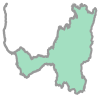

In [91]:
basins_inbbox.geometry[0]

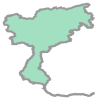

In [92]:
shapely.ops.transform(lambda x, y: (y, x),basins_inbbox.geometry[0])

creation of a function to be use in the *apply* method of pandas

In [93]:
def swapxy(geometry):
  geometry = shapely.ops.transform(lambda x, y: (y, x),geometry)
  return geometry

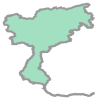

In [94]:
swapxy(basins_inbbox.geometry[0])

In [95]:
basins_inbbox['geometry'] = basins_inbbox['geometry'].apply(lambda geometry: swapxy(geometry))

In [96]:
basins_inbbox.explore()

## Summary WFS
- there are different versions
- from the version 1.1.0 you can have the problem of the axis inverted
- check always the boundary: more is big and more you have to wait.. more you have to wait and more the connection can go in timeout
- if the dataset is available as geojson you can load directly in geopandas
- otherwise you need to download in another format (eg. gml), save it and load as normal file


# OGG API is the future!!!

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/ogc_api.png)

visit
- [https://ogcapi.ogc.org/](https://ogcapi.ogc.org/)
- [OGC API Features](https://github.com/INSPIRE-MIF/gp-ogc-api-features)
- [learning OGC API features](http://opengeospatial.github.io/e-learning/ogcapi-features/text/basic-main.html)
- [OGC API SensorThings](https://github.com/INSPIRE-MIF/gp-ogc-sensorthings-api)
- [OGC API Records](https://github.com/INSPIRE-MIF/gp-ogc-api-records)

examples
- [https://geoe3platform.eu/geoe3](https://geoe3platform.eu/geoe3)
- [https://geonovum.github.io/wfs3-experiments/docs/Clients.html](https://geonovum.github.io/wfs3-experiments/docs/Clients.html)





# OpenStreetMap is a Common

![](https://napo.github.io/geospatialcourse2025/docs/osm_slides.png)

[lecture here](https://docs.google.com/presentation/d/e/2PACX-1vRnBevBrlr10ySX1xRQZflhjwbjQfOxHb0XYVlDc7lSX19FPQEeIMQP3y5eW08z652yduYCmgheco5e/pub?start=false&loop=false&delayms=3000)



## RAW Data
OSM XML
![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/osmdata1.png)

## OverPass API
![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/overpassturbo.png)


* [http://overpass-turbo.eu/](http://overpass-turbo.eu/)
* [https://overpass-ultra.trailsta.sh/](https://overpass-ultra.trailsta.sh/)

## Protocol Buffer
[https://developers.google.com/protocol-buffers](https://developers.google.com/protocol-buffers )

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/pbf.png)


* [planet](https://planet.openstreetmap.org/)
* [geofabrik](https://download.geofabrik.de)
* [estratti osm italia](https://osmit-estratti.wmcloud.org/)

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/export_hotosm.png)


[https://export.hotosm.org/en/v3/exports/91f6bf76-f310-46fe-a6dd-8f230489d1aa](https://export.hotosm.org/en/v3/exports/91f6bf76-f310-46fe-a6dd-8f230489d1aa)

for the italian regions, provinces and cities you can use the service made by Wikimedia Italia

![](https://raw.githubusercontent.com/napo/geospatial_course_unitn/master/images/osm_estratti.png)

[https://osmit-estratti.wmcloud.org/](https://osmit-estratti.wmcloud.org/)

Eg.
[Trento](https://osmit-estratti.wmcloud.org/dati/poly/comuni/pbf/022205_Trento.osm.pbf)

You can transform the pbf to a geopackage by using ogr2ogr
```bash
wget https://osmit-estratti.wmcloud.org/dati/poly/comuni/pbf/022205_Trento.osm.pbf
ogr2ogr -f "GPKG" trento.gpkg 022205_Trento.osm.pbf
```

In [97]:
!apt-get install gdal-bin

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  python3-gdal python3-numpy
Suggested packages:
  libgdal-grass python-numpy-doc python3-pytest
The following NEW packages will be installed:
  gdal-bin python3-gdal python3-numpy
0 upgraded, 3 newly installed, 0 to remove and 41 not upgraded.
Need to get 5,168 kB of archives.
After this operation, 25.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 python3-numpy amd64 1:1.21.5-1ubuntu22.04.1 [3,467 kB]
Get:2 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 python3-gdal amd64 3.8.4+dfsg-1~jammy0 [1,095 kB]
Get:3 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy/main amd64 gdal-bin amd64 3.8.4+dfsg-1~jammy0 [605 kB]
Fetched 5,168 kB in 3s (1,655 kB/s)
Selecting previously unselected package python3-numpy.
(Reading database ... 125082 files and direc

In [98]:
!wget https://osmit-estratti.wmcloud.org/output/pbf/comuni/022205_Trento.osm.pbf
!ogr2ogr -f "GPKG" trento.gpkg 022205_Trento.osm.pbf

--2025-11-06 20:06:29--  https://osmit-estratti.wmcloud.org/output/pbf/comuni/022205_Trento.osm.pbf
Resolving osmit-estratti.wmcloud.org (osmit-estratti.wmcloud.org)... 185.15.56.49, 2a02:ec80:a000:1::1d
Connecting to osmit-estratti.wmcloud.org (osmit-estratti.wmcloud.org)|185.15.56.49|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5171211 (4.9M) [application/octet-stream]
Saving to: ‘022205_Trento.osm.pbf’

022205_Trento.osm.p 100%[===================>]   4.93M  32.0MB/s    in 0.2s    

2025-11-06 20:06:29 (32.0 MB/s) - ‘022205_Trento.osm.pbf’ saved [5171211/5171211]

0...10...20...30...40...50...60...70...80...90...100 - done.


In [99]:
from pyogrio import list_layers
list_layers('trento.gpkg')

array([['points', 'Point'],
       ['lines', 'LineString'],
       ['multilinestrings', 'MultiLineString'],
       ['multipolygons', 'MultiPolygon'],
       ['other_relations', 'GeometryCollection']], dtype=object)

In [100]:
lines = gpd.read_file("trento.gpkg",layer="lines")

In [101]:
lines.highway.unique()

array(['primary', 'trunk_link', 'trunk', 'motorway_link', 'residential',
       'tertiary', 'unclassified', 'secondary', 'service', 'motorway',
       'pedestrian', None, 'footway', 'path', 'secondary_link',
       'cycleway', 'steps', 'track', 'primary_link', 'living_street',
       'tertiary_link', 'platform', 'via_ferrata', 'services', 'raceway',
       'construction', 'proposed', 'elevator'], dtype=object)

In [102]:
driving_roads = lines[lines.highway.isin(['secondary', 'trunk_link', 'trunk', 'motorway_link',
                          'residential','tertiary', 'unclassified', 'service',
                          'motorway', 'secondary_link', 'cycleway','primary',
                          'primary_link', 'tertiary_link', 'living_street','services',"yes"])]

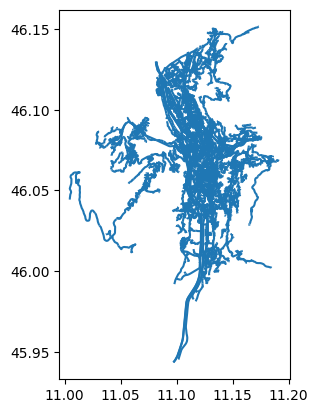

In [103]:
driving_roads.plot()
plt.show()

In [104]:
walking_roads = lines[lines.highway.isin(['pedestrian','steps', 'footway', 'path',
       'living_street', 'services','track'])]

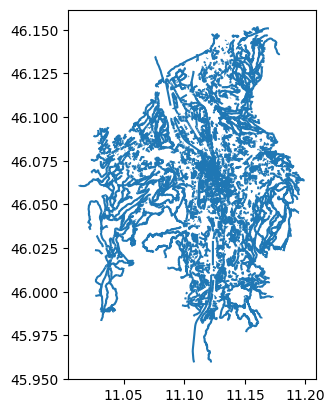

In [106]:
walking_roads.plot()
plt.show()

In [107]:
polygons = gpd.read_file("trento.gpkg",layer="multipolygons")

In [108]:
polygons.building.unique()

array([None, 'yes', 'school', 'university', 'kiosk', 'office',
       'apartments', 'public_building', 'public', 'monastery', 'villa',
       'retail', 'hospital', 'detached', 'residential', 'castle',
       'parking', 'train_station', 'house', 'church', 'sports_hall',
       'bridge', 'cathedral', 'mall', 'manor', 'commercial', 'industrial',
       'service', 'supermarket', 'terrace', 'roof', 'warehouse', 'hotel',
       'transportation', 'kindergarten', 'presbytery', 'theatre', 'civic',
       'data_center', 'shed', 'chapel', 'semidetached_house', 'ruins',
       'construction', 'cinema', 'government', 'sports_centre',
       'grandstand', 'dormitory', 'depot', 'hostel', 'fire_station',
       'garage', 'garages', 'hangar', 'terminal', 'farm', 'private',
       'transformer_tower', 'greenhouse', 'farm_auxiliary', 'manufacture',
       'collapsed', 'fort', 'azienda_agricola', 'carport', 'convent',
       'tower', 'restaurant', 'hut', 'stadium', 'stable', 'gazebo',
       'wayside_shri

In [109]:
buildings = polygons[~polygons['building'].isna()]

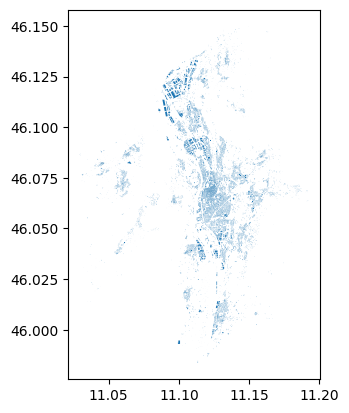

In [110]:
buildings.plot()
plt.show()

In [111]:
pip install pyrosm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 26.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 2.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pyrobuf-0.9.3-cp312-cp312-linux_x86_64.whl
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 47.1 MB/s eta 0:00:00
  Created wheel for pyrosm: filename=pyrosm-0.6.2-cp312-cp312-linux_x86_64.whl size=8136159 sha256=3c0def9e52986e8b2d4f1187109b9862d83c7afb2ccd8e6af221fc742bc3c9bf
  Stored in directory: /root/.cache/pip/wheels/33/aa/81/7751cbc2166a4d8dfd6da1cd0c44979037568083df9b065bc8
  Created wheel for cykhash: filename=cykhash-2.0.1-cp312-cp312-linux_x86_64.whl size=3803088 sha256=9486efa0158728561f1e163b2a83814d216bf87c4dfffae227dd1f55697964d6

In [112]:
import pyrosm
osm = pyrosm.OSM("022205_Trento.osm.pbf")

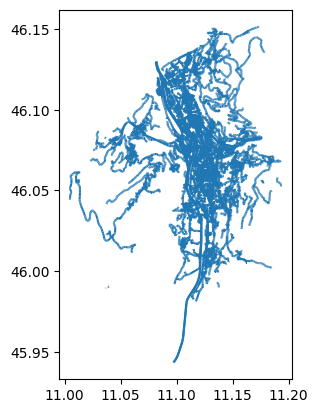

In [113]:
drive_net = osm.get_network(network_type="driving")
drive_net.plot()
plt.show()

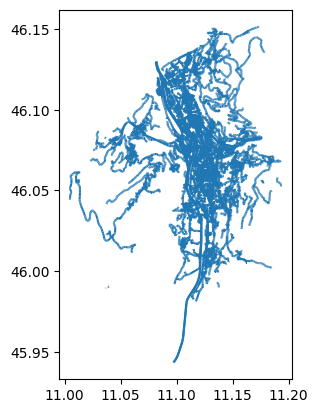

In [114]:
drive_walking = osm.get_network(network_type="walking")
drive_net.plot()
plt.show()

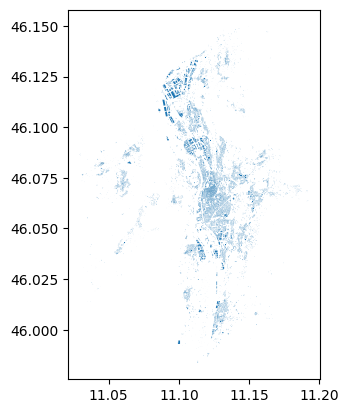

In [115]:
buildings = osm.get_buildings()
buildings.plot()
plt.show()

In [116]:
buildings["tags"].unique()

array(['{"access":"customers","building:colour":"#cecabe","castle_type":"palace","historic":"castle","historic:civilization":"medieval","name:fr":"Palais pr\\u00E9torien","roof:shape":"gabled","wikidata":"Q26997946"}',
       '{"access":"yes","capacity":"488","capacity:disabled":"yes","contact:phone":"+39 0461 238855","contact:website":"https://www.trentinomobilita.it/parcheggi-coperti","fee":"yes","operator:type":"public","parking":"multi-storey","roof:levels":"0"}',
       None, '{"roof:levels":"0"}',
       '{"contact:fax":"+39 0461 281999","isced:level":"5"}',
       '{"roof:levels":"1"}',
       '{"fee":"yes","min_height":"0","tourism":"museum","wikidata":"Q3891498"}',
       '{"network":"Ferrovia Trento-Mal\\u00E9-Mezzana","wikidata":"Q3971184"}',
       '{"admin_level":"6","short_name":"Palazzo PAT","wikidata":"Q104869996"}',
       '{"building:levels:underground":"1","roof:levels":"1","wheelchair":"yes","wikimedia_commons":"Category:Palazzo delle Dame di Sion (Trento)"}',
     

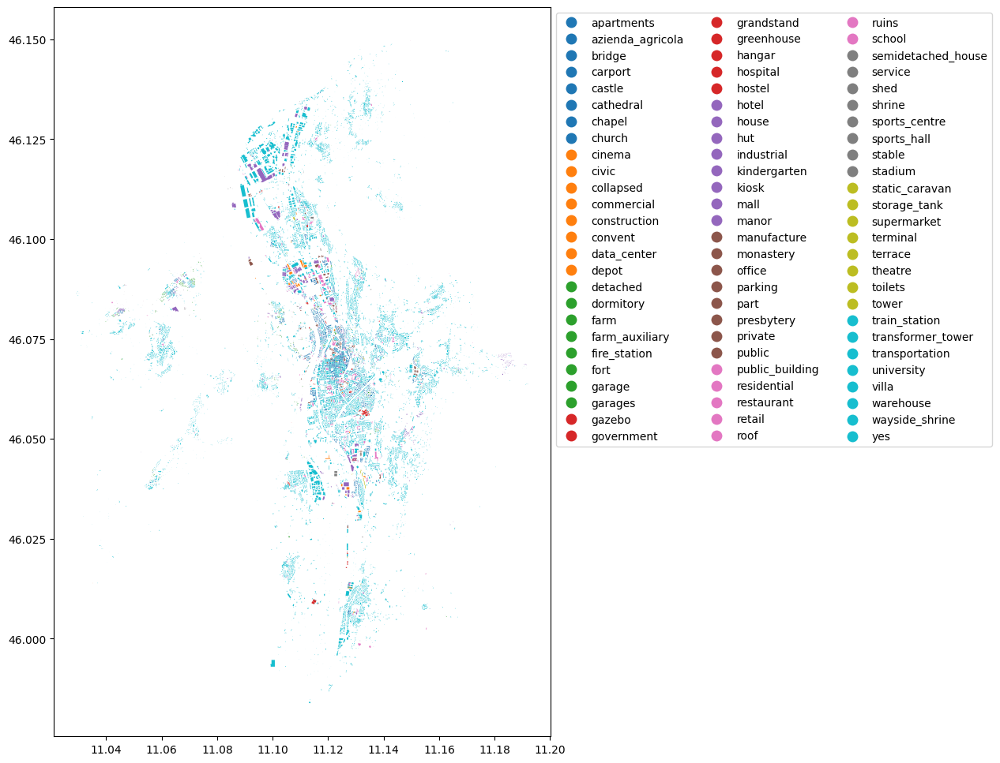

In [117]:
ax = buildings.plot(column="building", figsize=(12,12), legend=True, legend_kwds=dict(loc='upper left', ncol=3, bbox_to_anchor=(1, 1)))
plt.show()

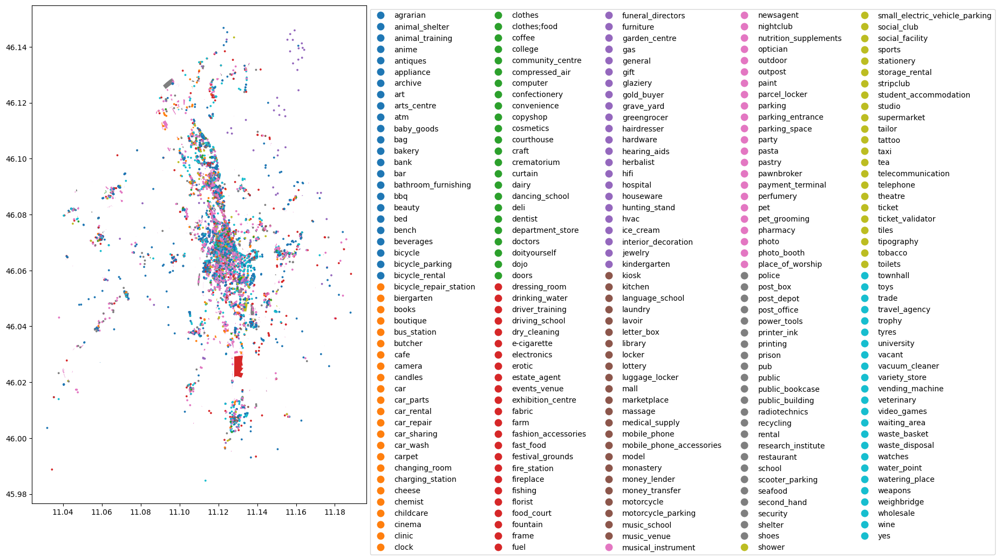

In [118]:
custom_filter = {'amenity': True, "shop": True}
pois = osm.get_pois(custom_filter=custom_filter)

# Gather info about POI type (combines the tag info from "amenity" and "shop")
pois["poi_type"] = pois["amenity"]
pois["poi_type"] = pois["poi_type"].fillna(pois["shop"])

# Plot
ax = pois.plot(column='poi_type', markersize=3, figsize=(12,12), legend=True, legend_kwds=dict(loc='upper left', ncol=5, bbox_to_anchor=(1, 1)))
plt.show()

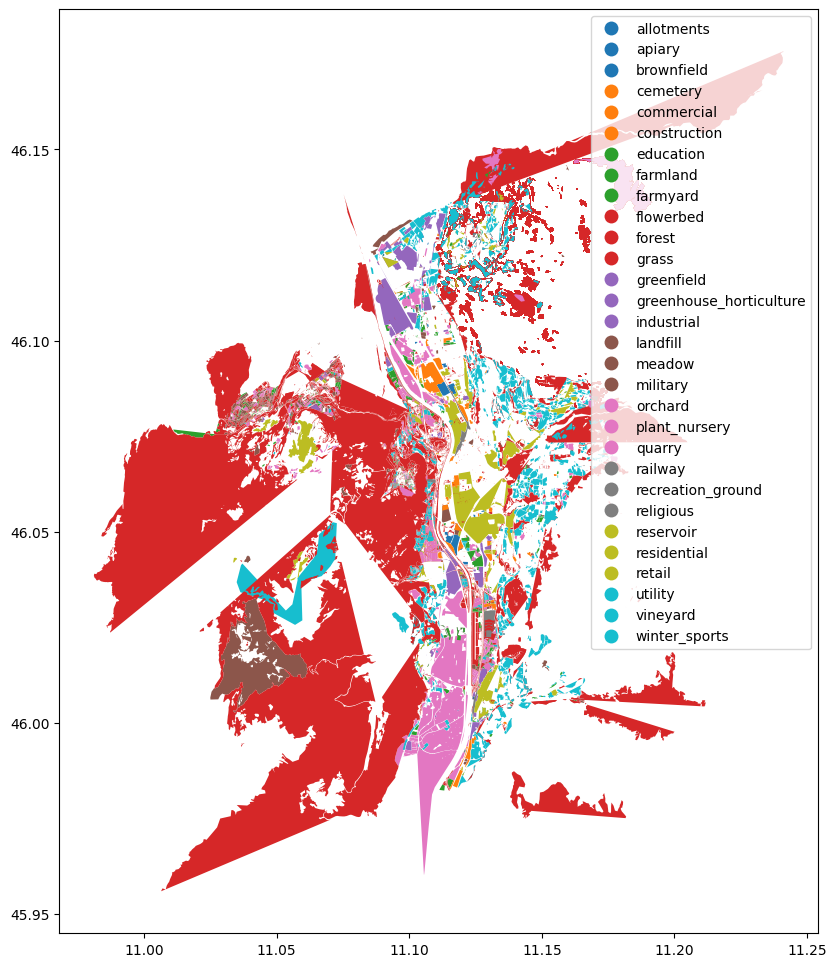

In [119]:
landuse = osm.get_landuse()
landuse.plot(column='landuse', legend=True, figsize=(12,12))
plt.show()

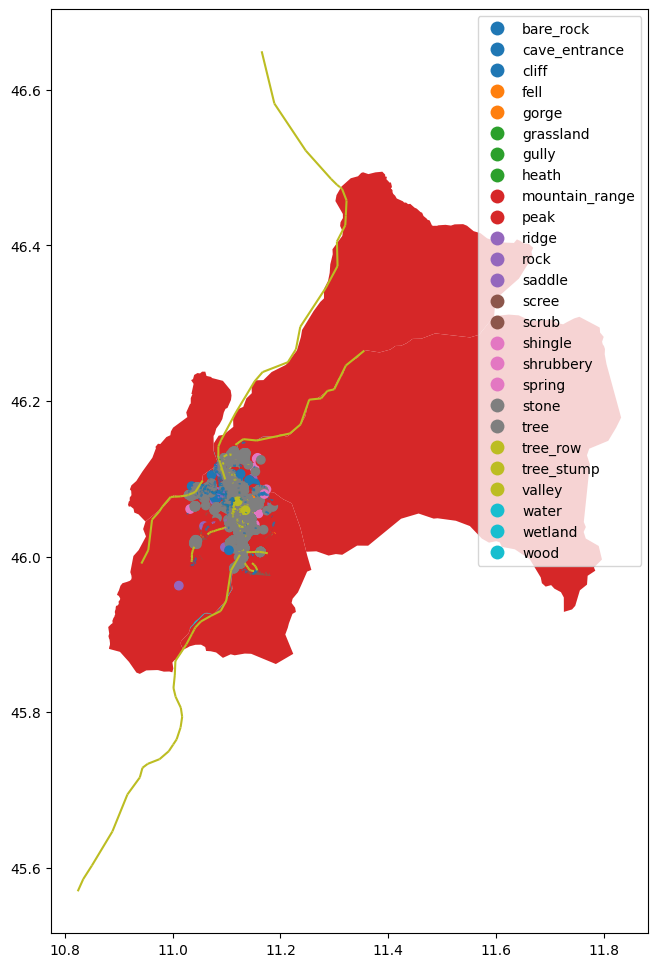

In [120]:
natural = osm.get_natural()
natural.plot(column='natural', legend=True, figsize=(12,12))
plt.show()

In [121]:
natural.explore("natural",tooltip="natural")

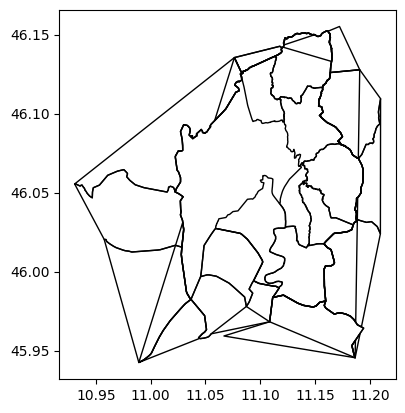

In [122]:
# Read all boundaries using the default settings
boundaries = osm.get_boundaries()
boundaries.plot(facecolor="none", edgecolor="black")
plt.show()

In [123]:
boundaries[boundaries.admin_level == '10']

,name,ref,website,admin_level,boundary,postal_code,id,timestamp,version,changeset,geometry,tags,osm_type
21,Mattarello,None,None,10,administrative,None,5197617407,1605300317,3,0,"POLYGON ((11.11135 45.98357, 11.11399 45.98611...","{""type"":""boundary""}",relation
22,Ravina Romagnano,None,None,10,administrative,None,5209506289,1698154084,5,0,"POLYGON ((11.05942 46.02727, 11.08167 46.02417...","{""type"":""boundary"",""wikidata"":""Q96782134""}",relation
23,Villazzano,None,None,10,administrative,None,5221395482,1731881393,5,0,"POLYGON ((11.1399 46.05708, 11.13982 46.05664,...","{""type"":""boundary"",""wikidata"":""Q96782139""}",relation
24,Oltrefersina,None,None,10,administrative,None,5233284842,1731881391,4,0,"POLYGON ((11.11731 46.04328, 11.11777 46.0429,...","{""type"":""boundary"",""wikidata"":""Q2743684""}",relation
25,Meano,2,https://www.comune.trento.it/Comune/Organi-pol...,10,administrative,None,11357635489,1724098005,2,0,"POLYGON ((11.11353 46.1363, 11.11443 46.13655,...","{""type"":""boundary"",""wikidata"":""Q96782131""}",relation
26,Gardolo,1,https://www.comune.trento.it/Comune/Organi-pol...,10,administrative,None,11375561186,1724098005,3,0,"POLYGON ((11.08327 46.12534, 11.08363 46.12528...","{""type"":""boundary"",""wikidata"":""Q96782130""}",relation
27,Povo,7,https://www.comune.trento.it/Comune/Organi-pol...,10,administrative,None,11393489659,1724098005,2,0,"POLYGON ((11.13917 46.06875, 11.13922 46.06877...","{""type"":""boundary"",""wikidata"":""Q96782137""}",relation
28,Argentario,6,https://www.comune.trento.it/Comune/Organi-pol...,10,administrative,None,11411418133,1724098005,3,0,"POLYGON ((11.11614 46.10914, 11.1169 46.1094, ...","{""type"":""boundary"",""wikidata"":""Q33662224""}",relation


In [124]:
boundaries[boundaries.admin_level == '10'].explore('name',tooltip='name')

In [125]:
boundaries.explore("admin_level",tooltip="name")

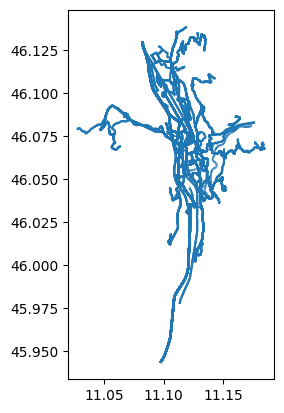

In [126]:
routes = ["bus","railway"] #, "subway", "train", "tram", "trolleybus"]
rails = ["light_rail", "rail"] #, "subway", "tram"]
bus = ['yes']
transit = osm.get_data_by_custom_criteria(custom_filter={
                                        'route': routes,
                                        'railway': rails,
                                        'bus': bus,
                                        'public_transport': True},
                                        # Keep data matching the criteria above
                                        filter_type="keep",
                                        # Do not keep nodes (point data)
                                        keep_nodes=False,
                                        keep_ways=True,
                                        keep_relations=True)
transit.plot()
plt.show()

In [127]:
transit.explore('type')

---
# Exercises
- identify the location of these address with a geocoder
   - Piazza Castello, Udine
   - Piazza Italia, Trento
   - Piazza Foroni, Torino
- find the administrative border of "comunità di valle" (community of valley) of Province Autonomous of Trento
- identify all the rivers inside the smallest community of valley of Trentino
- download from OpenStreetMap all supermarkets inside the bounding box of the city in this point <br/>latitude: 45.8861<br/>
longitude: 11.0447<br/>
- identify the longest road of the city (state roads, walking routes, motorways are excluded).<br/>
- How many drinking water are in this city?
- how many benches in this city have the backrest?